# Time Series Plots

/var/folders/y2/nnpdyztj42sft29s3dp0nybr0000gn/T/ipykernel_45378/3974868060.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ufo_data_usa['datetime'] = pd.to_datetime(ufo_data_usa['datetime'])


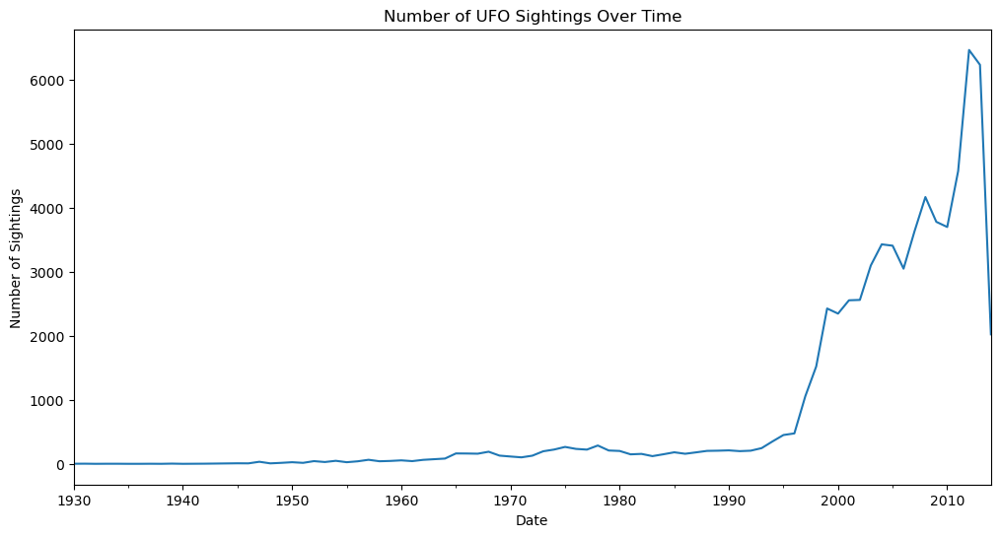

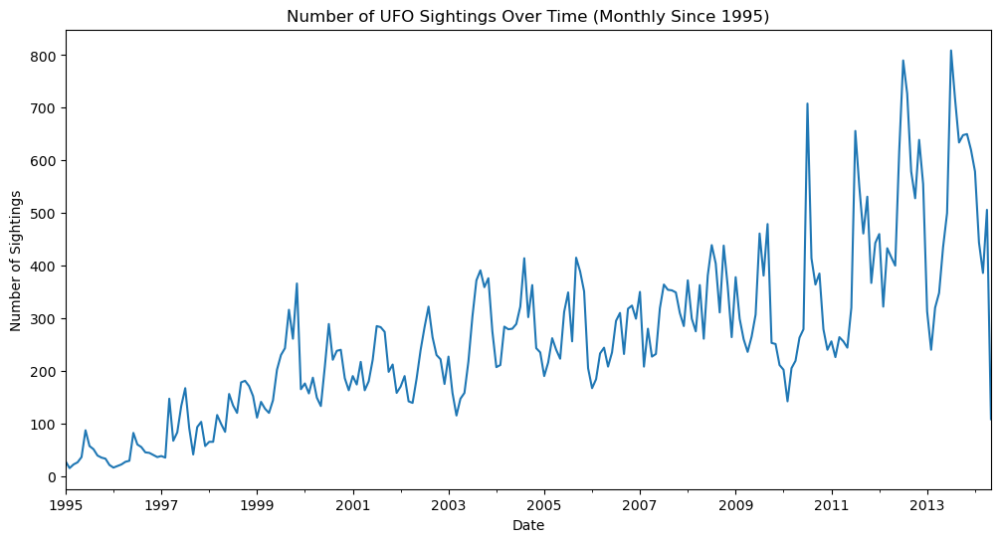

In [42]:
import matplotlib.pyplot as plt
import pandas as pd

# Convert the datetime column to datetime format if it's not already
ufo_data_usa['datetime'] = pd.to_datetime(ufo_data_usa['datetime'])

# Group the data by datetime and count the number of sightings for each time period
sightings_over_time = ufo_data_usa.groupby(pd.Grouper(key='datetime', freq='Y')).size()

# Plot the time series
plt.figure(figsize=(12, 6))
sightings_over_time.plot()
plt.title('Number of UFO Sightings Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Sightings')
plt.show()


# Filter the DataFrame to include data starting from the year 1995
ufo_data_since_1995 = ufo_data_usa[ufo_data_usa['datetime'].dt.year >= 1995]

# Group the filtered data by datetime and count the number of sightings for each time period
sightings_over_time = ufo_data_since_1995.groupby(pd.Grouper(key='datetime', freq='M')).size()

# Plot the time series
plt.figure(figsize=(12, 6))
sightings_over_time.plot()
plt.title('Number of UFO Sightings Over Time (Monthly Since 1995)')
plt.xlabel('Date')
plt.ylabel('Number of Sightings')

plt.show()

/var/folders/y2/nnpdyztj42sft29s3dp0nybr0000gn/T/ipykernel_45378/2006834665.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ufo_data_usa['year'] = ufo_data_usa['datetime'].dt.year
/Users/victoriahaley/anaconda3/lib/python3.10/site-packages/matplotlib/animation.py:880: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


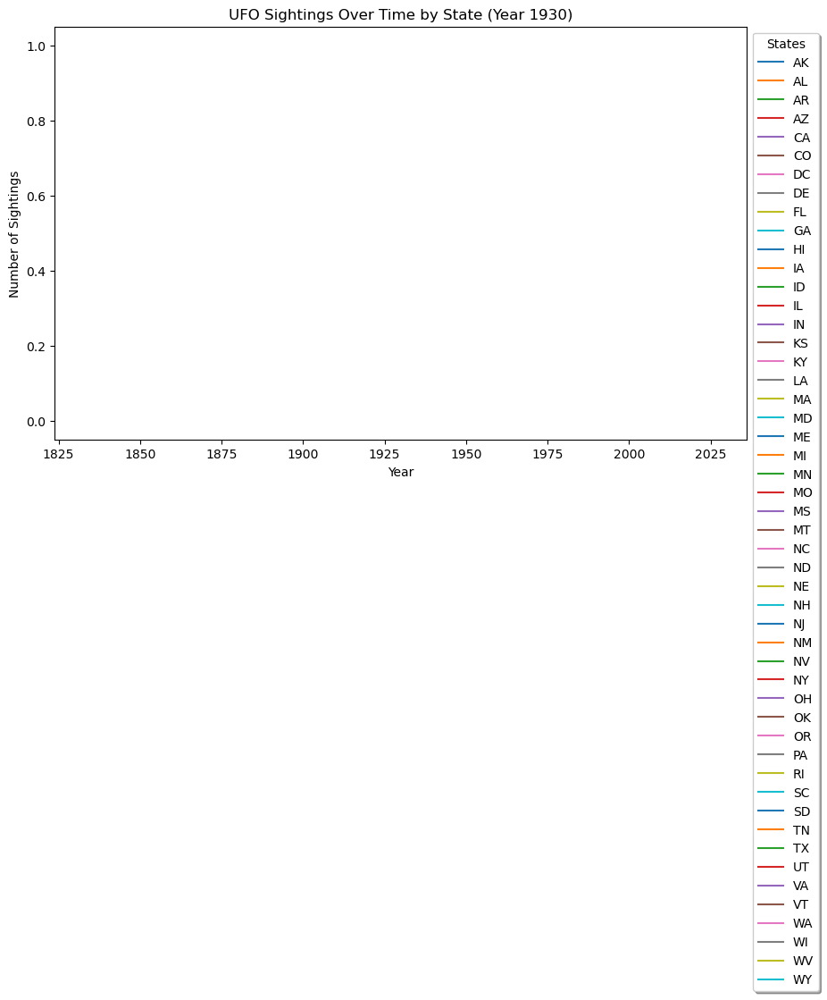

In [35]:
ufo_data_usa['year'] = ufo_data_usa['datetime'].dt.year

# Group the data by state and year, and count the number of sightings
sightings_by_state_year = ufo_data_usa.groupby(['State', 'year']).size().unstack(fill_value=0)


from matplotlib.animation import FuncAnimation
from IPython.display import HTML


# Initialize the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Define the update function
def update(frame):
    ax.clear()
    ax.plot(sightings_by_state_year.columns[:frame+1], sightings_by_state_year.iloc[:, :frame+1].T)
    ax.set_title(f'UFO Sightings Over Time by State (Year {sightings_by_state_year.columns[frame]})')
    ax.set_xlabel('Year')
    ax.set_ylabel('Number of Sightings')
    ax.legend(sightings_by_state_year.index, loc='upper left', bbox_to_anchor=(1, 1), title='States', fancybox=True, shadow=True)

# Create the animation
ani = FuncAnimation(fig, update, frames=len(sightings_by_state_year.columns), repeat=False)

# Display the animation
HTML(ani.to_jshtml())

In [38]:
# Specify the filename for the GIF
ufo_TS_gif = 'animated_time_series.gif'

# Create a writer object to save the animation as a GIF
writer = animation.PillowWriter(fps=10)

# Save the animation as a GIF file
ani.save(ufo_TS_gif, writer=writer)

# Print a message to confirm the successful saving of the GIF file
print(f"Animation saved as '{ufo_TS_gif}'")

Animation saved as 'animated_time_series.gif'


# UFO sightings x Time stats

In [49]:
# Extract the year from the datetime column
ufo_data_usa['year'] = ufo_data_usa['datetime'].dt.year

# Find the year with the highest number of sightings
year_with_highest_sightings = ufo_data_usa['year'].value_counts().idxmax()

# Count the number of sightings for that year
count_of_sightings_in_highest_year = sightings_in_highest_year.shape[0]

# Filter the DataFrame for sightings in the year with the highest number
sightings_in_highest_year = ufo_data_usa[ufo_data_usa['year'] == year_with_highest_sightings]

# Find the state, shape, and duration for these sightings
state_with_highest_sightings = sightings_in_highest_year['state'].value_counts().idxmax()
shape_with_highest_sightings = sightings_in_highest_year['shape'].value_counts().idxmax()
duration_with_highest_sightings = sightings_in_highest_year['duration (seconds)'].max()

from datetime import timedelta

# Convert the duration to a timedelta object
duration_timedelta = timedelta(seconds=duration_with_highest_sightings)

# Extract hours, minutes, and seconds from the timedelta object
duration_hours = duration_timedelta.days * 24 + duration_timedelta.seconds // 3600
duration_minutes = (duration_timedelta.seconds % 3600) // 60
duration_seconds = duration_timedelta.seconds % 60


# Print the results
print(f"The year with the highest number of sightings: {year_with_highest_sightings}")
print(f"The count of sightings in the year with the highest number of sightings: {count_of_sightings_in_highest_year}")
print(f"The state with the highest number of sightings: {state_with_highest_sightings}")
print(f"The most common shape of sightings: {shape_with_highest_sightings}")
print(f"The longest duration of sighting: {duration_hours} hours, {duration_minutes} minutes, {duration_seconds} seconds")

The year with the highest number of sightings: 2012
The count of sightings in the year with the highest number of sightings: 6466
The state with the highest number of sightings: CA
The most common shape of sightings: light
The longest duration of sighting: 14617 hours, 33 minutes, 20 seconds


/var/folders/y2/nnpdyztj42sft29s3dp0nybr0000gn/T/ipykernel_45378/472114902.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ufo_data_usa['year'] = ufo_data_usa['datetime'].dt.year


In [47]:
# Find the index of the row with the maximum duration
max_duration_index = ufo_data_usa['duration (seconds)'].idxmax()

# Retrieve the row with the maximum duration
row_with_max_duration = ufo_data_usa.loc[max_duration_index]

# Print the row
print(row_with_max_duration)

datetime                                                    1991-09-15 18:00:00
city                                                                 Greenbrier
state                                                                        AR
country                                                                      US
shape                                                                     light
duration (seconds)                                                     66276000
comments                      Orange or amber balls or orbs of light multipl...
date posted                                                 2008-03-31 00:00:00
latitude                                                              35.233889
longitude                                                              -92.3875
FIPS                                                                       5045
State                                                                        AR
County Name                             

I checked this out because of the duration that printed above to see what was going on and it looks like something weird happened with the duration(seconds) column. The duration of this report supposedly was 18,410 hours

# Sightings by Socio-Economic Data

In [62]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# Aggregate sightings by FIPS
sightings_count = ufo_data_usa.groupby('FIPS').size().reset_index(name='sightings_count')

# Aggregate socio-economic variables by FIPS code
socio_economic_agg = ufo_data_usa.groupby('FIPS').agg({'Poverty Estimate, All Ages': 'mean',
                                                       'Poverty Percent, All Ages': 'mean',
                                                       'Median Household Income': 'mean',
                                                       'Estimated Population 2022': 'mean',
                                                       'BIRTHS 2022': 'mean',
                                                       'DEATHS 2022': 'mean'})

# Calculate correlation between the number of sightings and each socio-economic variable
correlation_p_values = {}
for column in socio_economic_agg.columns:
    correlation_coefficient, p_value = pearsonr(sightings_count['sightings_count'], socio_economic_agg[column])
    correlation_p_values[column] = (correlation_coefficient, p_value)

# Print correlation coefficients and p-values
for column, (correlation_coefficient, p_value) in correlation_p_values.items():
    print(f"Correlation between Number of Sightings and {column}: {correlation_coefficient}")
    print(f"P-value: {p_value}")


Correlation between Number of Sightings and Poverty Estimate, All Ages: 0.824645654933383
P-value: 0.0
Correlation between Number of Sightings and Poverty Percent, All Ages: -0.12734582072944073
P-value: 1.5702290365500163e-11
Correlation between Number of Sightings and Median Household Income: 0.28330566525803097
P-value: 1.6554951011923625e-52
Correlation between Number of Sightings and Estimated Population 2022: 0.70084234157645
P-value: 0.0
Correlation between Number of Sightings and BIRTHS 2022: 0.6928779454793033
P-value: 0.0
Correlation between Number of Sightings and DEATHS 2022: 0.6944522498050492
P-value: 0.0


In [65]:
# Find the FIPS code with the highest number of sightings
fips_with_highest_sightings = sightings_count['FIPS'].iloc[sightings_count['sightings_count'].idxmax()]

# Count the number of sightings for that FIPS code
count_of_sightings_in_highest_fips = sightings_count['sightings_count'].max()

# Filter the DataFrame for sightings in the FIPS code with the highest number
sightings_in_highest_fips = ufo_data_usa[ufo_data_usa['FIPS'] == fips_with_highest_sightings]

# Calculate socio-economic statistics for these sightings
poverty_estimate_in_highest_fips = sightings_in_highest_fips['Poverty Estimate, All Ages'].mean()
poverty_percent_in_highest_fips = sightings_in_highest_fips['Poverty Percent, All Ages'].mean()
median_household_income_in_highest_fips = sightings_in_highest_fips['Median Household Income'].mean()
estimated_population_in_highest_fips = sightings_in_highest_fips['Estimated Population 2022'].mean()
births_in_highest_fips = sightings_in_highest_fips['BIRTHS 2022'].mean()
deaths_in_highest_fips = sightings_in_highest_fips['DEATHS 2022'].mean()

# Print the results
print(f"The FIPS code with the highest number of sightings: {fips_with_highest_sightings}")
print(f"The count of sightings in the FIPS code with the highest number of sightings: {count_of_sightings_in_highest_fips}")
print(f"The mean Poverty Estimate: {poverty_estimate_in_highest_fips}")
print(f"The mean Poverty Percent: {poverty_percent_in_highest_fips}")
print(f"The mean Median Household Income: {median_household_income_in_highest_fips}")
print(f"The mean Estimated Population 2022: {estimated_population_in_highest_fips}")
print(f"The mean BIRTHS 2022: {births_in_highest_fips}")
print(f"The mean DEATHS 2022: {deaths_in_highest_fips}")

print()

# Find the FIPS code with the lowest number of sightings
fips_with_lowest_sightings = sightings_count.loc[sightings_count['sightings_count'].idxmin(), 'FIPS']

# Count the number of sightings for that FIPS code
count_of_sightings_in_lowest_fips = sightings_count['sightings_count'].min()

# Filter the DataFrame for sightings in the FIPS code with the lowest number
sightings_in_lowest_fips = ufo_data_usa[ufo_data_usa['FIPS'] == fips_with_lowest_sightings]

# Find the mean socio-economic statistics for these sightings
mean_poverty_estimate = sightings_in_lowest_fips['Poverty Estimate, All Ages'].mean()
mean_poverty_percent = sightings_in_lowest_fips['Poverty Percent, All Ages'].mean()
mean_median_income = sightings_in_lowest_fips['Median Household Income'].mean()
mean_population = sightings_in_lowest_fips['Estimated Population 2022'].mean()
mean_births = sightings_in_lowest_fips['BIRTHS 2022'].mean()
mean_deaths = sightings_in_lowest_fips['DEATHS 2022'].mean()

# Print the results
print(f"The FIPS code with the lowest number of sightings: {fips_with_lowest_sightings}")
print(f"The count of sightings in the FIPS code with the lowest number of sightings: {count_of_sightings_in_lowest_fips}")
print(f"The mean Poverty Estimate: {mean_poverty_estimate}")
print(f"The mean Poverty Percent: {mean_poverty_percent}")
print(f"The mean Median Household Income: {mean_median_income}")
print(f"The mean Estimated Population 2022: {mean_population}")
print(f"The mean BIRTHS 2022: {mean_births}")
print(f"The mean DEATHS 2022: {mean_deaths}")


The FIPS code with the highest number of sightings: 6037
The count of sightings in the FIPS code with the highest number of sightings: 1928
The mean Poverty Estimate: 1328547.0
The mean Poverty Percent: 13.900000000000004
The mean Median Household Income: 82455.0
The mean Estimated Population 2022: 9721138.0
The mean BIRTHS 2022: 98065.0
The mean DEATHS 2022: 79777.0

The FIPS code with the lowest number of sightings: 1023
The count of sightings in the FIPS code with the lowest number of sightings: 1
The mean Poverty Estimate: 2554.0
The mean Poverty Percent: 20.7
The mean Median Household Income: 44458.0
The mean Estimated Population 2022: 12439.0
The mean BIRTHS 2022: 137.0
The mean DEATHS 2022: 200.0
